# 使用示例

In [1]:
import os
import sys
from pathlib import Path
# 获取当前工作目录
project_root = Path(os.getcwd())
# 将项目根目录添加到Python路径
sys.path.append(str(project_root))
# 导入项目中的模块
from src.data.remote_sensing import mosaic_raster_proj, multiband_index_calculator,clip_raster_aligin, create_lon_lat, check_raster, download_gee
from src.data.data_cleaning import data_cleaning
from src.utils import table_to_shp
from src.features import point_sample
from src.models.soil_property import train_soil_property, predict_soil_properties, generate_soil_property_report
from src.models.soil_type import train_soil_type_rf, predict_soil_type
from src.visualization import create_decision_tree
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display
%matplotlib inline

## 数据下载及预处理


In [9]:
# 下载数据 download_gee.py
# 前提条件：1. Google Earth Engine API 2. 能访问国际互联网

region_path = Path(project_root, 'data/raw/study_area.shp') # 研究区域
output_folder = Path(project_root, 'data/raw/sentinel_raster') # 输出文件夹
start_date = '2022-01-01' # 开始日期
end_date = '2022-12-31' # 结束日期
log_file = Path(project_root, 'logs/gee.log') # 日志文件

# 调用下载数据函数
download_gee.main(region_path, output_folder, start_date, end_date, log_file)
print('数据下载完成')

In [ ]:
# 镶嵌下载的栅格数据 mosaic_raster_proj.py
input_dir = Path(project_root, 'data/raw/sentinel_raster') # 输入文件夹
output_path = Path(project_root, 'data/raw/sentinel_raster/mosaic.tif') # 输出文件夹
target_crs = 'EPSG:4544' # 目标坐标系
log_file = Path(project_root, 'logs/mosaic.log') # 日志文件

# 调用镶嵌数据函数
mosaic_raster_proj.main(input_dir, output_path, target_crs, log_file)
print('数据镶嵌完成')
print('镶嵌后的数据大小为：', os.path.getsize(output_path) / 1024 ** 3, 'GB')

In [3]:
# 计算多波段指数 multiband_index_calculator.py
input_path = Path(project_root, 'data/raw/gl_bands26_2023.tif') # 输入文件夹
output_dir = Path(project_root, 'data/raw/sentinel_raster') # 输出文件夹
log_file = Path(project_root, 'logs/indices.log') # 日志文件
indices_config = {
    "ndvi": {"bands": [8, 4]},  # 归一化植被指数 (Normalized Difference Vegetation Index)
    "savi": {"bands": [8, 4]},  # 土壤调整植被指数 (Soil Adjusted Vegetation Index)
    "ndwi": {"bands": [3, 8]},  # 归一化差值水体指数 (Normalized Difference Water Index)
    "evi": {"bands": [8, 4, 2]},  # 增强植被指数 (Enhanced Vegetation Index)
    "lswi": {"bands": [8, 11]},  # 地表水体指数 (Land Surface Water Index)
    "mndwi": {"bands": [3, 11]},  # 改进的归一化差值水体指数 (Modified Normalized Difference Water Index)
    "ndmi": {"bands": [8, 11]},  # 归一化差值水分指数 (Normalized Difference Moisture Index)
    "vari": {"bands": [4, 3, 2]}  # 可见光大气阻抗指数 (Visible Atmospherically Resistant Index)
}
pca_config = {
        "bands": [1,2,3,4,5,6,7,8,9,10,11,12], # 指定要进行PCA分析的波段
        "n_components": 2, # 指定PCA分析的数量
        "plot": False # 是否绘制PCA分析结果
}

# 调用计算多波段指数函数
multiband_index_calculator.main(input_path, output_dir, log_file, indices_config, pca_config)
print('多波段指数计算完成')

多波段指数计算完成


In [4]:
# 创建经纬度栅格 create_lon_lat.py
input_path = Path(project_root, 'data/raw/processed/dem.tif') # 参考栅格
output_path = Path(project_root, 'data/raw/processed') # 输出文件夹
log_file = Path(project_root, 'logs/create_lon_lat.log') # 日志文件

# 调用创建经纬度栅格函数
create_lon_lat.main(input_path, output_path, log_file)  
print('经纬度栅格创建完成')

经纬度栅格创建完成


In [ ]:
# 裁剪和对齐栅格数据 (统一坐标、像元大小、维度)clip_raster_aligin.py
base_raster = Path(project_root, 'data/raw/processed/dem.tif') # 参考栅格
input_vector = Path(project_root, 'data/raw/study_area.shp') # 输入矢量 确定范围
other_rasters_path = Path(project_root, 'data/raw/processed') # 需要裁剪和对齐栅格文件夹
output_folder = Path(project_root, 'data/raw/soil_property') # 输出文件夹
output_crs = 'EPSG:4544' # 输出坐标系
log_file = Path(project_root, 'logs/clip_raster_aligin.log') # 日志文件

# 调用裁剪和对齐栅格数据函数
clip_raster_aligin.main(base_raster, input_vector, other_rasters_path, output_folder, output_crs, log_file)
print('栅格数据裁剪完成')

In [5]:
# 检查栅格数据（检查坐标参考系统、像元大小、维度） check_raster.py
input_path = Path(project_root, 'data/soil_property') # 输入文件夹 
log_file = Path(project_root, 'logs/check_raster.log') # 日志文件

# 调用检查栅格数据函数
check_raster.main(input_path, log_file)
print('栅格数据检查完成')

处理栅格: 100%|██████████| 13/13 [00:02<00:00,  5.13it/s]

栅格数据检查完成


## 数据采样和清洗(土壤属性)


In [8]:
# 数据清洗 data_cleaning.py
df_path = Path(project_root, 'data/soil_property_table/soil_property_data.csv') # 输入需要清洗的三普检测结果csv文件
lon_col = 'dwjd' # 经度列名
lat_col = 'dwwd' # 纬度列名
columns =  ['ph', 'ylzjhl', 'yjz', 'qdan', 'qlin', 'qjia', 'qxi', 'yxlin', 'sxjia','hxjia'] # 需要清洗的标签列
output_folder = Path(project_root, 'figures/data_clean') # 输出文件夹
log_file = Path(project_root, 'logs/data_cleaning.log') # 日志文件
global_std_threshold = 5 # 全局标准差阈值
local_std_threshold = 3 # 局部标准差阈值
neighbors = 8 # 相邻点数


# 调用数据清洗函数
data_cleaning.main(df_path, lon_col, lat_col, columns, output_folder, log_file, global_std_threshold, local_std_threshold, neighbors)
print('数据清洗完成')



数据清洗完成


In [11]:
# 表转shp点 table_to_shp.py
input_file = Path(project_root, 'figures/data_clean/cleaned_data.csv') # 输入需要转换的csv文件 确保csv文件列字符长度小于等于10（因shp限制）
output_file = Path(project_root, 'data/point_sample/cleaned_data.shp') # 输出文件夹
lon_col = 'dwjd' # 经度列名
lat_col = 'dwwd' # 纬度列名
input_crs = 4326 # 输入坐标系
output_crs = 4544 # 输出坐标系
log_file = Path(project_root, 'logs/table_to_shp.log') # 日志文件

# 调用表转shp点函数
table_to_shp.main(input_file, output_file, lon_col, lat_col, log_file, input_crs, output_crs)
print('表转shp点完成')

Shapefile已保存至: d:\soil-mapping\data\point_sample\cleaned_data.shp
表转shp点完成


d:\soil-mapping\src\utils\table_to_shp.py:34: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(output_file, driver="ESRI Shapefile", encoding='utf-8')
d:\soil-mapping\venv\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'a_NIGHT2022' to 'a_NIGHT202'
  ogr_write(


In [12]:
# 数据采样 point_sample.py
df_path = Path(project_root, 'data/point_sample/cleaned_data.shp') # 输入需要采样的三普检测结果shp文件
raster_folder_path = Path(project_root, 'data/soil_property/') # 输入需要采样的栅格文件夹
output_csv_path = Path(project_root, 'data/soil_property_table/point_sample.csv') # 输出csv文件
log_file = Path(project_root, 'logs/point_sample.log') # 日志文件
keep_out_of_bounds = False # 是否保留超出边界的值
fill_value = np.nan # 填充值 默认是nan

# 调用数据采样函数
point_sample.main(df_path, raster_folder_path, output_csv_path, keep_out_of_bounds, fill_value,log_file)
print('数据采样完成')


处理栅格: 100%|██████████| 13/13 [00:00<00:00, 90.68it/s]

数据采样完成


## 土壤属性模型训练、预测及模型评估报告生成

In [13]:
# 土壤属性模型训练 train_soil_property.py
file_path = Path(project_root, 'data/soil_property_table/point_sample.csv') # 输入需要训练的csv文件
save_dir = Path(project_root, 'models/soil_property') # 输出文件夹
log_file = Path(project_root, 'logs/train_soil_property.log') # 日志文件
# 标签字典,regression为回归问题，classification为分类问题
label_dict = {
    "ph": "regression",
    "yjz": "regression",
    "ylzjhl": "regression",
    "qdan": "regression",
    "qlin": "regression",
    "yxlin": "regression",
    "sxjia": "regression",
    "hxjia": "regression",
}
feature_cols = ['a_DEM', 'a_evi',  'a_lswi', 'a_Mean','a_mndwi', 'a_ndmi', 'a_ndvi', 'a_ndwi', 'a_NIGHT2022', 'a_pca_1','a_pca_2']  # 您的特征列
coord_cols = ["a_lon", "a_lat"]
param_grid = {
    'n_estimators': np.arange(10, 200, 10),
    'max_depth': [None] + list(np.arange(10, 110, 10)),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
use_feature_optimization = True # 是否使用特征优化（函数中使用的特征优化为迭代特征优化），默认True    

# 调用土壤属性模型训练函数
train_soil_property.main(file_path, label_dict, feature_cols, coord_cols, param_grid, save_dir, log_file, use_feature_optimization)
print('土壤属性模型训练完成')


处理标签:   0%|          | 0/8 [00:00<?, ?it/s]d:\soil-mapping\venv\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
d:\soil-mapping\venv\Lib\site-packages\numpy\ma\core.py:2846: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
处理标签:  12%|█▎        | 1/8 [00:31<03:41, 31.61s/it]

Finished learning regression model
Finished kriging residuals


处理标签:  25%|██▌       | 2/8 [00:58<02:54, 29.01s/it]

Finished learning regression model
Finished kriging residuals


处理标签:  38%|███▊      | 3/8 [01:16<01:58, 23.70s/it]

Finished learning regression model
Finished kriging residuals


处理标签:  50%|█████     | 4/8 [01:29<01:19, 19.80s/it]

Finished learning regression model
Finished kriging residuals


处理标签:  62%|██████▎   | 5/8 [01:44<00:53, 17.71s/it]

Finished learning regression model
Finished kriging residuals


处理标签:  75%|███████▌  | 6/8 [01:57<00:32, 16.32s/it]

Finished learning regression model
Finished kriging residuals


处理标签:  88%|████████▊ | 7/8 [02:15<00:16, 16.88s/it]

Finished learning regression model
Finished kriging residuals


处理标签: 100%|██████████| 8/8 [02:39<00:00, 19.91s/it]

Finished learning regression model
Finished kriging residuals


土壤属性模型训练完成


In [14]:
# 土壤属性模型预测 predict_soil_properties.py
model_dir = Path(project_root, 'models/soil_property') # 输入模型文件夹
feature_dir = Path(project_root, 'data/soil_property') # 输入特征栅格文件夹
output_dir = Path(project_root, 'data/soil_property_predict') # 输出文件夹
log_file = Path(project_root, 'logs/predict_soil_properties.log') # 日志文件
training_data_path = Path(project_root, 'data/soil_property_table/point_sample.csv') # 输入训练数据文件夹
shapefile_path = Path(project_root, 'data/raw/study_area.shp') # 输入shapefile文件,用于指定预测范围，默认不指定预测范围
coord_cols = ["a_lon", "a_lat"]
use_rk = False # 是否使用kriging插值

# 调用土壤属性模型预测函数
# 限定预测范围
# predict_soil_properties.main(log_file,model_dir, feature_dir, output_dir, training_data_path, coord_cols, use_rk, shapefile_path)
# 不指定预测范围
predict_soil_properties.main(log_file,model_dir, feature_dir, output_dir, training_data_path, coord_cols, use_rk,shapefile_path=None)
print('土壤属性模型预测完成')



预测土壤属性:   0%|          | 0/8 [00:00<?, ?it/s]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  12%|█▎        | 1/8 [00:57<06:39, 57.01s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  25%|██▌       | 2/8 [01:54<05:42, 57.13s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  38%|███▊      | 3/8 [03:18<05:47, 69.50s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  50%|█████     | 4/8 [03:36<03:17, 49.36s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  62%|██████▎   | 5/8 [04:14<02:14, 44.99s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  75%|███████▌  | 6/8 [05:16<01:41, 50.99s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性:  88%|████████▊ | 7/8 [06:57<01:07, 67.21s/it]d:\soil-mapping\venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


Finished learning regression model
Finished kriging residuals


预测土壤属性: 100%|██████████| 8/8 [07:59<00:00, 59.96s/it]

土壤属性模型预测完成


In [15]:
# 生成土壤属性报告 generate_soil_property_report.py
eval_dir = Path(project_root, 'models/soil_property') # 输入模型文件夹
prediction_dir = Path(project_root, 'data/soil_property_predict') # 输入预测结果文件夹
output_dir = Path(project_root, 'reports/soil_property') # 输出文件夹
log_file = Path(project_root, 'logs/generate_soil_property_report.log') # 日志文件

# 调用生成土壤属性报告函数
generate_soil_property_report.main(log_file, eval_dir, prediction_dir, output_dir, model_dir)
print('土壤属性报告生成完成')

处理histograms: 100%|██████████| 8/8 [00:04<00:00,  1.70it/s]


土壤属性报告生成完成


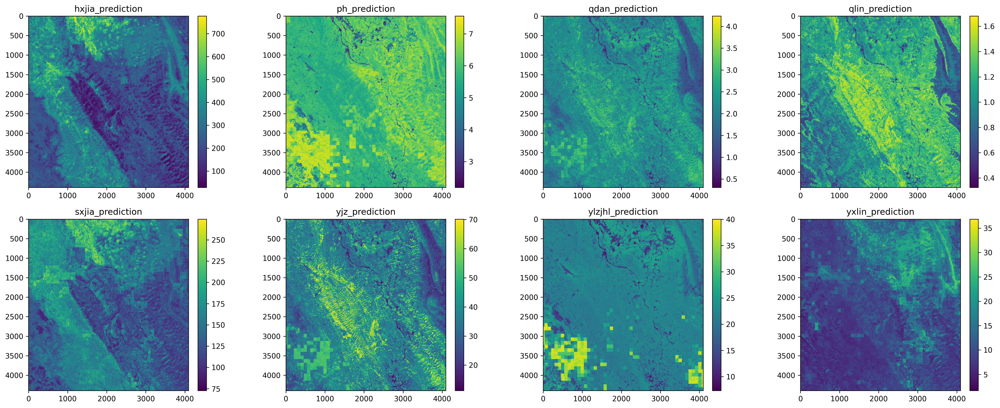

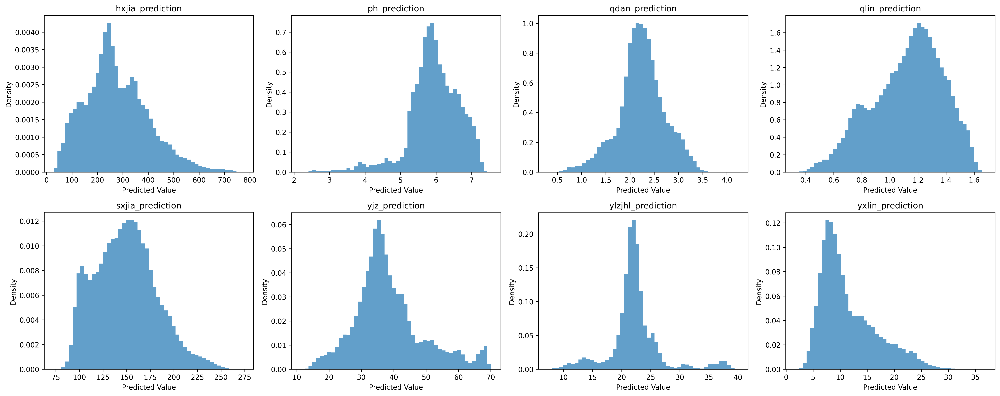

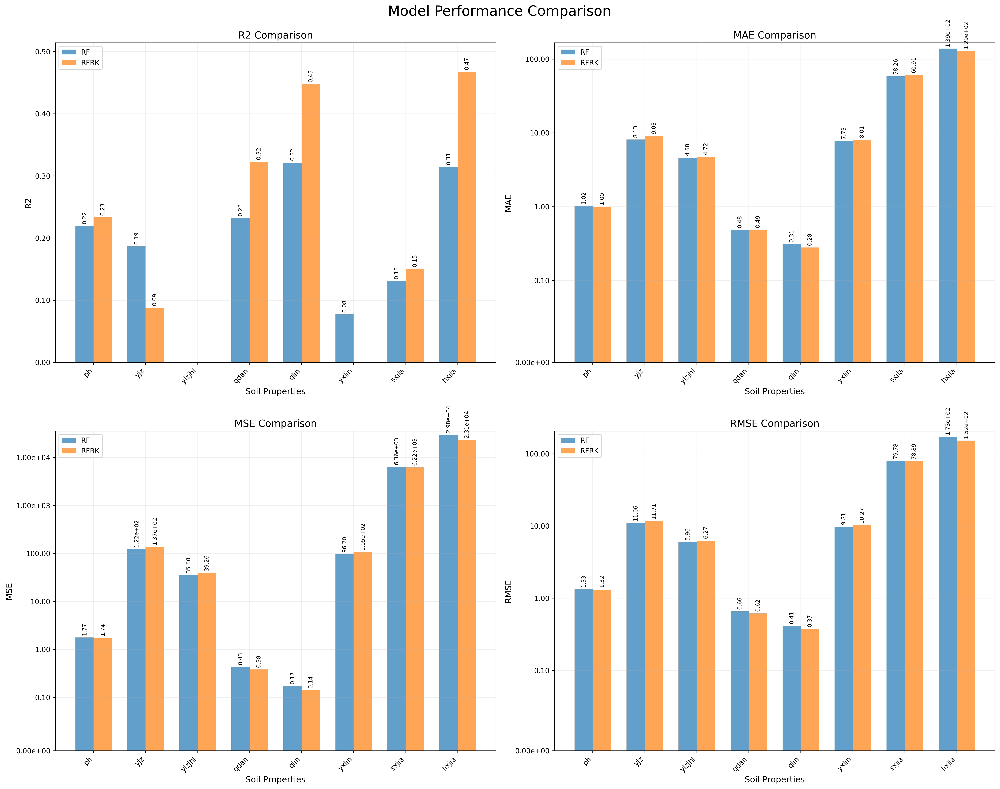

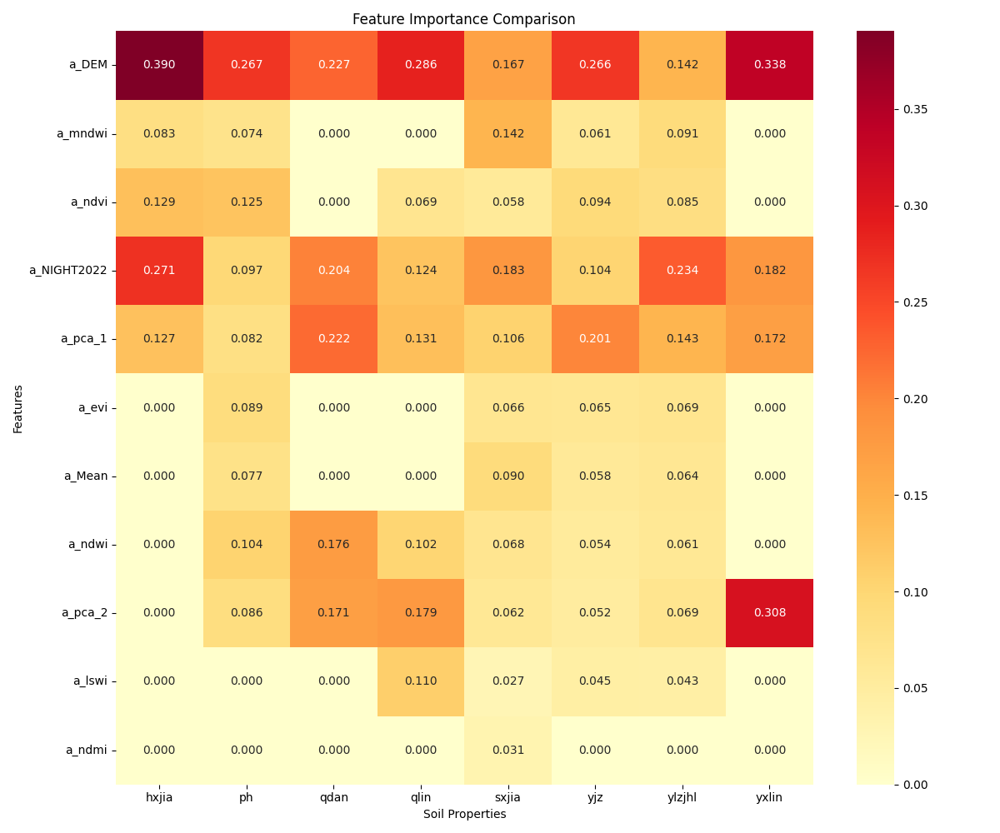

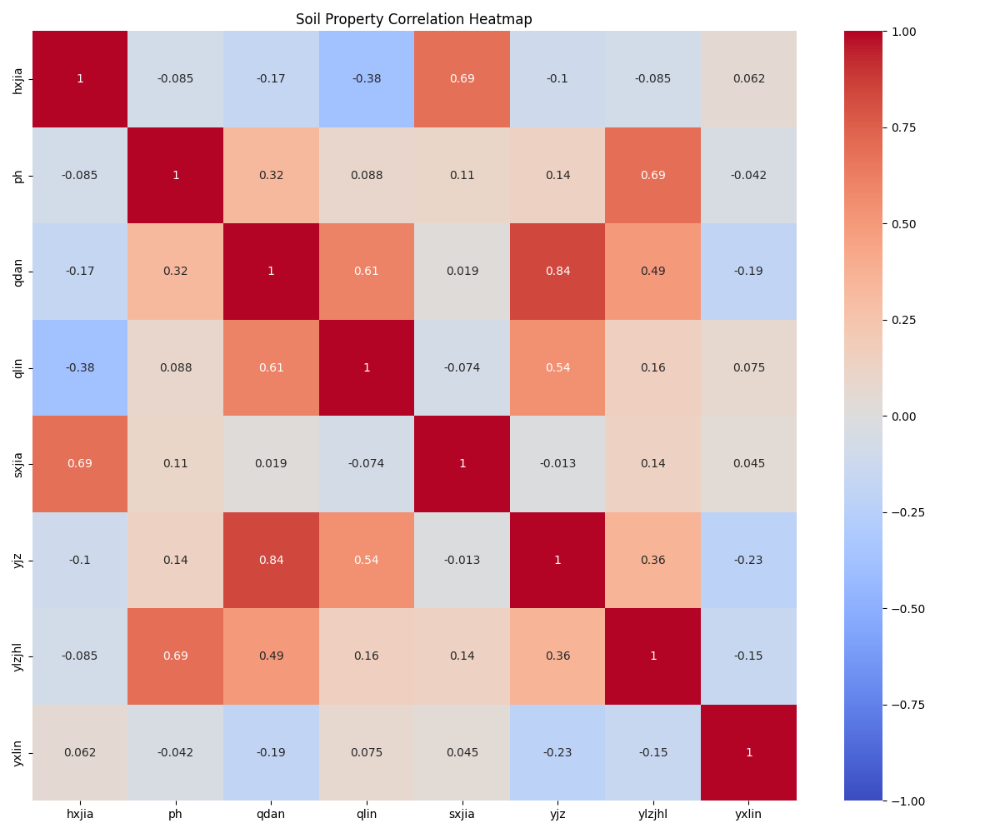

In [16]:
# 显示报告中的部分图片 （小区域示例数据展示，故模型评估得分较低）
display(Image(filename=Path(project_root, 'reports/soil_property/combined_prediction_maps.png')))
display(Image(filename=Path(project_root, 'reports/soil_property/combined_histograms.png')))
display(Image(filename=Path(project_root, 'reports/soil_property/model_performance_comparison.png')))
display(Image(filename=Path(project_root, 'reports/soil_property/feature_importance_comparison.png')))
display(Image(filename=Path(project_root, 'reports/soil_property/soil_property_correlation_heatmap.png')))

## 土壤类型模型训练、预测及模型评估报告生成(RF)


In [ ]:
# 土壤类型模型训练 train_soil_type.py

In [ ]:
# 土壤类型模型训练 train_soil_type.py


In [ ]:
# 土壤类型评估报告 generate_soil_type_report.py


In [ ]:
## 土壤类型模型训练、预测及模型评估报告生成(Autogluon)

In [ ]:
# 土壤类型模型训练 train_soil_type_autogluon.py
